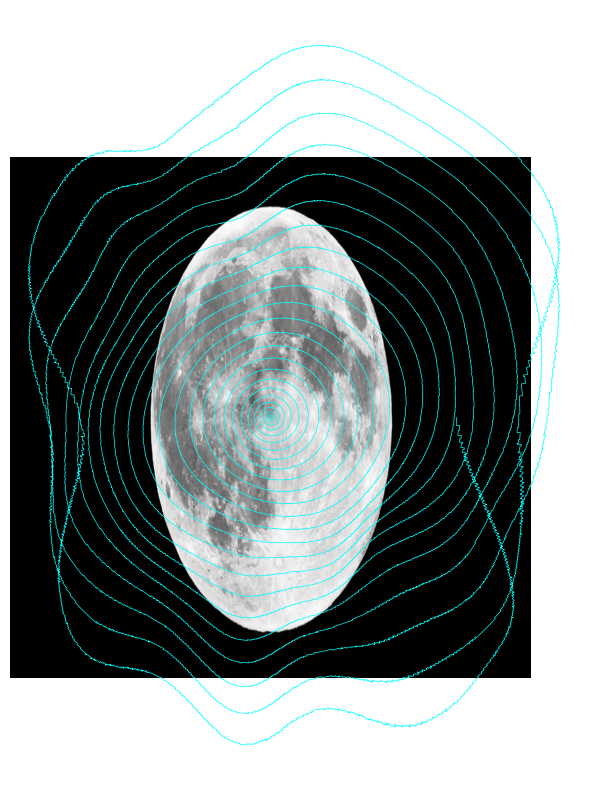

In [17]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
from PIL import Image

# Load and process the image
image_path = r"C:\Users\surabhit\Downloads\xXp45gLeBTBt4jPuZcawUJ-970-80.jpg.webp"  # Updated path to your image
with Image.open(image_path) as img:
    img_gray = img.convert('L')  # Convert to grayscale
image_array = np.array(img_gray)

# Smooth the image to serve as a potential field
potential_field = gaussian_filter(image_array, sigma=20)

# Generate a high-resolution base spiral
theta = np.linspace(0, 50 * np.pi, 9000000)  # More turns and more points
r = theta**2  # Spiral equation (Archimedean spiral)
x = r * np.cos(theta) / 50000  # Scale down
y = r * np.sin(theta) / 50000 # Scale down

# Adjust spiral based on the potential field
average_potential = np.mean(potential_field)
x_indices = np.clip((x * image_array.shape[1] / 2 + image_array.shape[1] / 2).astype(int), 0, image_array.shape[1] - 1)
y_indices = np.clip((y * image_array.shape[0] / 2 + image_array.shape[0] / 2).astype(int), 0, image_array.shape[0] - 1)

# Update positions x, y based on the potential field influence
x_mod = potential_field[y_indices, x_indices] / average_potential
y_mod = potential_field[y_indices, x_indices] / average_potential

x += x * x_mod * 0.5  # Scale the modulation to control distortion
y += y * y_mod * 0.5  # Scale the modulation to control distortion

# Plotting
plt.figure(figsize=(10, 10))
plt.imshow(image_array, cmap='gray', extent=[-1, 1, -1, 1])
plt.plot(x, y, color='cyan', linewidth=0.5)
plt.axis('off')
plt.show()


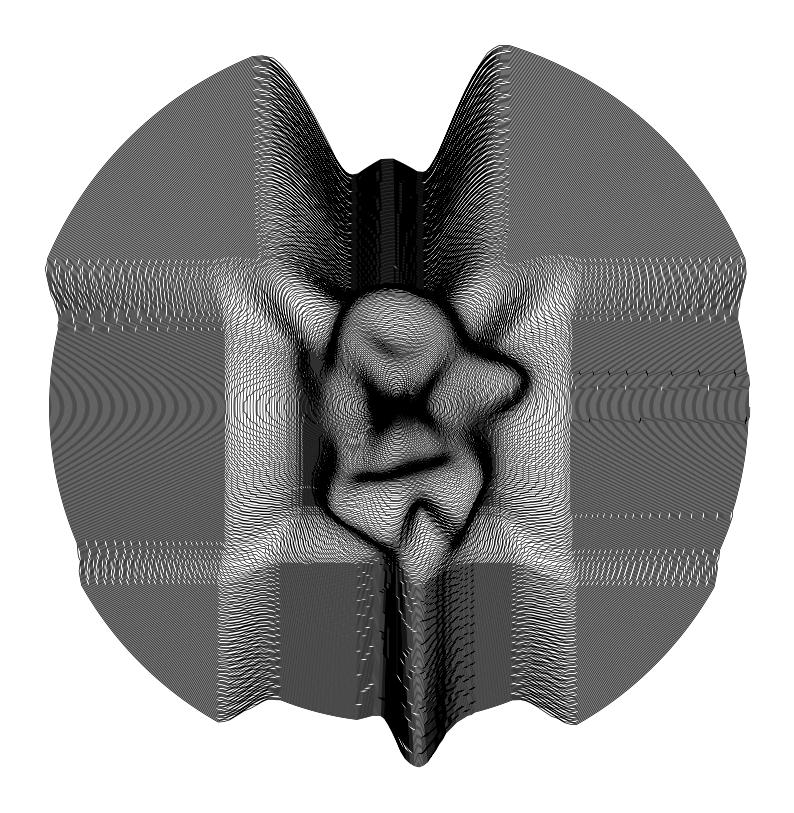

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
from PIL import Image

# Load and process the image
image_path = r"C:\Users\surabhit\Downloads\captain-haddock.png"
with Image.open(image_path) as img:
    img_gray = img.convert('L')  # Convert to grayscale
image_array = np.array(img_gray)

# Smooth the image to serve as a potential field
potential_field = gaussian_filter(image_array, sigma=10)  # Adjust sigma for smoother transitions

# Normalize the image for use as a potential field
normalized_image = potential_field / np.max(potential_field)

# Generate a closely packed base spiral
theta = np.linspace(0, 640 * np.pi, 160000)  # More turns and more points for smoother spiral
base_radius = 1 + theta  # Base radius proportional to theta

# Map coordinates from the spiral to the image, adjusting spiral's radius based on the image's intensity
x = base_radius * np.cos(theta)
y = base_radius * np.sin(theta)
x_indices = np.clip((x * image_array.shape[1] / np.max(base_radius) + image_array.shape[1] / 2).astype(int), 0, image_array.shape[1] - 1)
y_indices = np.clip((y * image_array.shape[0] / np.max(base_radius) + image_array.shape[0] / 2).astype(int), 0, image_array.shape[0] - 1)

# Modulate the spiral's radius based on the image's intensity
# Ensure the radius multiplier never falls below a certain threshold (e.g., 0.5)
radius_multiplier = 1 + (1 - normalized_image[y_indices, x_indices]) * 2  # Reduced impact
radius_multiplier = np.maximum(radius_multiplier, 0.5)  # Minimum threshold

# Calculate the new radius
adjusted_radius = base_radius * radius_multiplier
adjusted_x = adjusted_radius * np.cos(theta)
adjusted_y = adjusted_radius * np.sin(theta)

# Plotting
plt.figure(figsize=(10, 20))
plt.imshow(image_array, cmap='gray', extent=[-1, 1, -1, 1])
plt.plot(adjusted_x, adjusted_y, color='black', linewidth=0.5)
plt.axis('off')
plt.show()


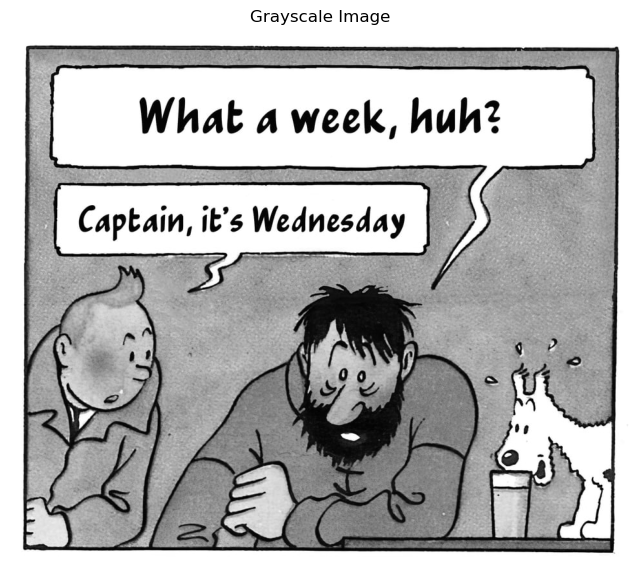

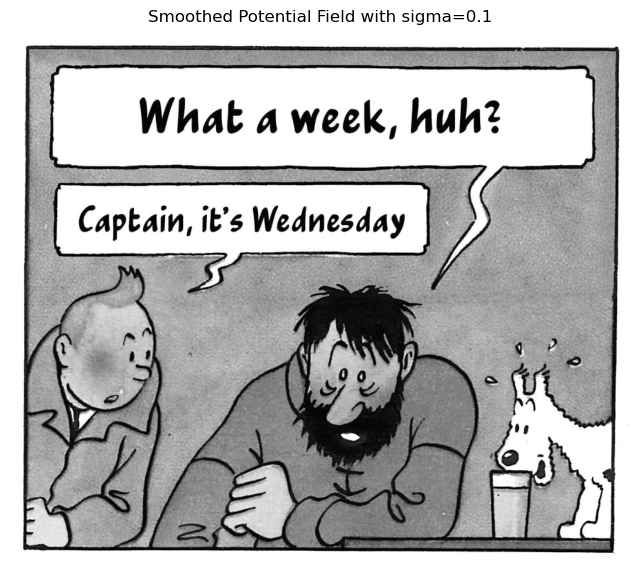

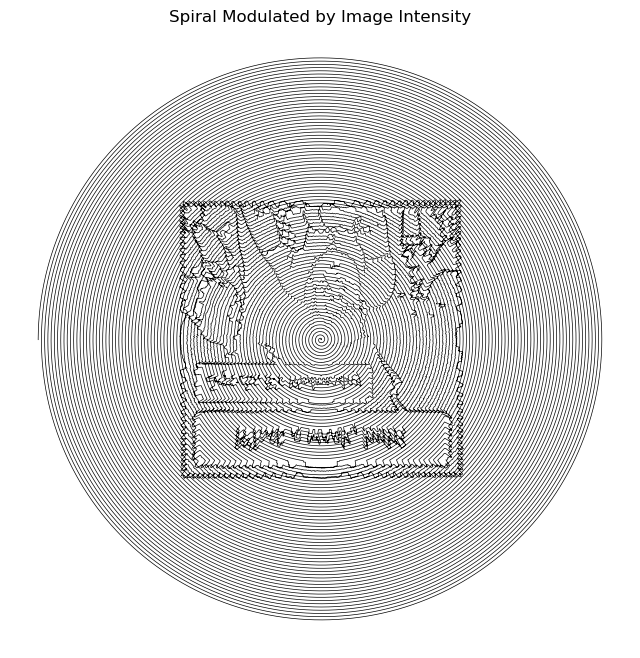

total rounds = 39.808917197452224


In [7]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
from PIL import Image

# Load and process the image
image_path = r"C:\Users\surabhit\Downloads\5n5dibawgvd61-3778409170.jpg" # Update this path to your actual image path
#image_path = r"C:\Users\surabhit\Downloads\captain-haddock.png"  # Update this path to your actual image path
with Image.open(image_path) as img:
    img_gray = img.convert('L')  # Convert to grayscale
image_array = np.array(img_gray)

# Step 1: Display the grayscale image
plt.figure(figsize=(8, 8))
plt.imshow(img_gray, cmap='gray')
plt.title('Grayscale Image')
plt.axis('off')
plt.show()

# Step 2: Apply Gaussian filter to create a detailed potential field
sigma_value = 0.1  # Lower sigma for more detail
potential_field = gaussian_filter(image_array, sigma=sigma_value)

# Display the potential field
plt.figure(figsize=(8, 8))
plt.imshow(potential_field, cmap='gray')
plt.title('Smoothed Potential Field with sigma={}'.format(sigma_value))
plt.axis('off')
plt.show()

# Normalize the image for use as a potential field
normalized_image = potential_field / np.max(potential_field)

# Generate a closely packed base spiral
theta = np.linspace(0, 175 * np.pi, 160000)  # More turns and more points for smoother spiral
base_radius = 1 + theta  # Base radius proportional to theta

# Map coordinates from the spiral to the image, adjusting spiral's radius based on the image's intensity
x = base_radius * np.cos(theta)
y = base_radius * np.sin(theta)
x_indices = np.clip((x * image_array.shape[1] / np.max(base_radius) + image_array.shape[1] / 2).astype(int), 0, image_array.shape[1] - 1)
y_indices = np.clip((y * image_array.shape[0] / np.max(base_radius) + image_array.shape[0] / 2).astype(int), 0, image_array.shape[0] - 1)

# Modulate the spiral's radius based on the image's intensity
radius_multiplier = 1 + (1 - normalized_image[y_indices, x_indices]) * 0.05  # Increased impact by modifying contrast
radius_multiplier = np.maximum(radius_multiplier, 0.7)  # Ensuring a minimum radius multiplier

# Calculate the new radius
adjusted_radius = base_radius * radius_multiplier
adjusted_x = adjusted_radius * np.cos(theta)
adjusted_y = adjusted_radius * np.sin(theta)

# Plotting the final spiral
plt.figure(figsize=(8, 16))
plt.imshow(image_array, cmap='gray', extent=[-1, 1, -1, 1])
plt.plot(adjusted_x, adjusted_y, color='black', linewidth=0.5)
plt.title('Spiral Modulated by Image Intensity')
plt.axis('off')
plt.show()



print('total rounds =', 250/(2*3.14))


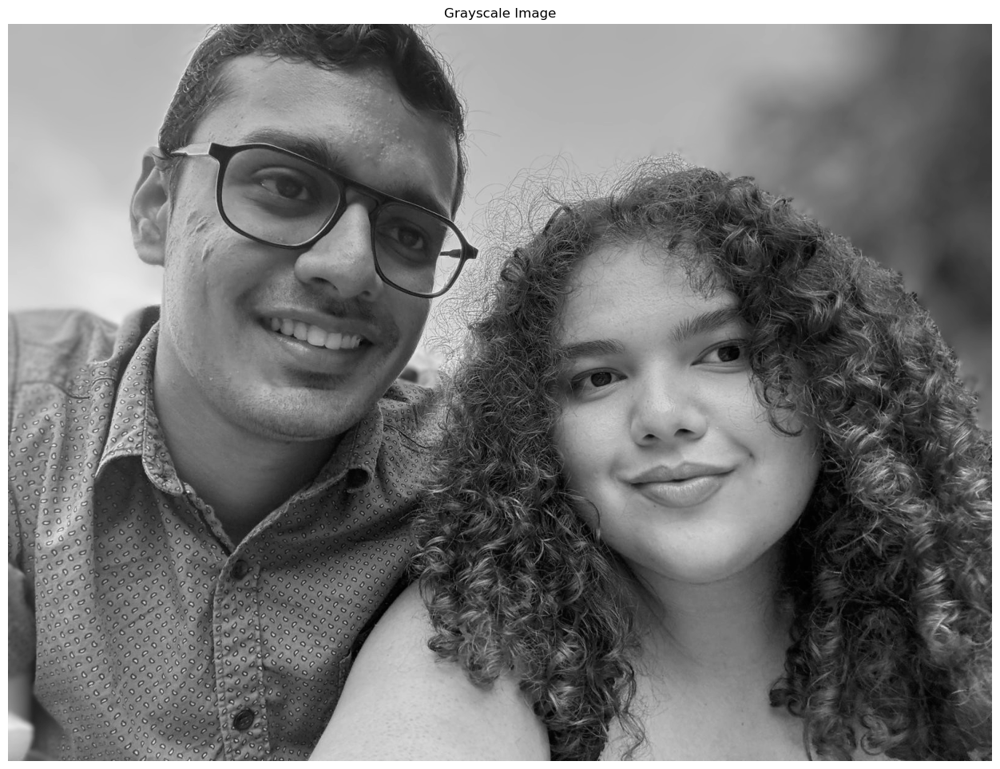

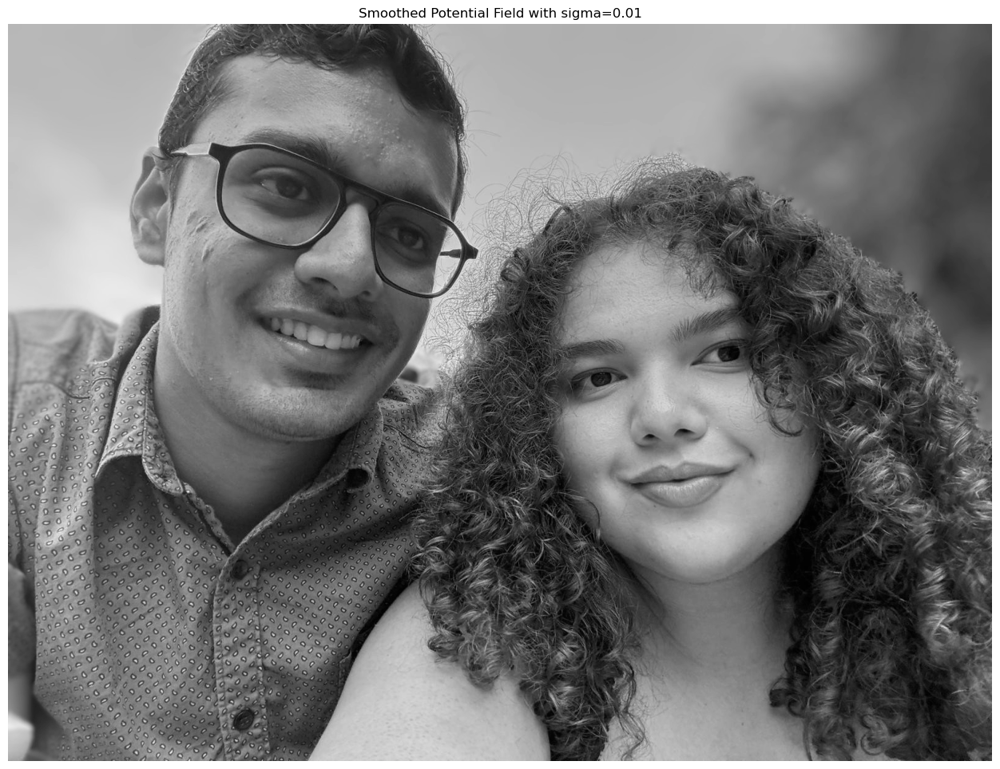

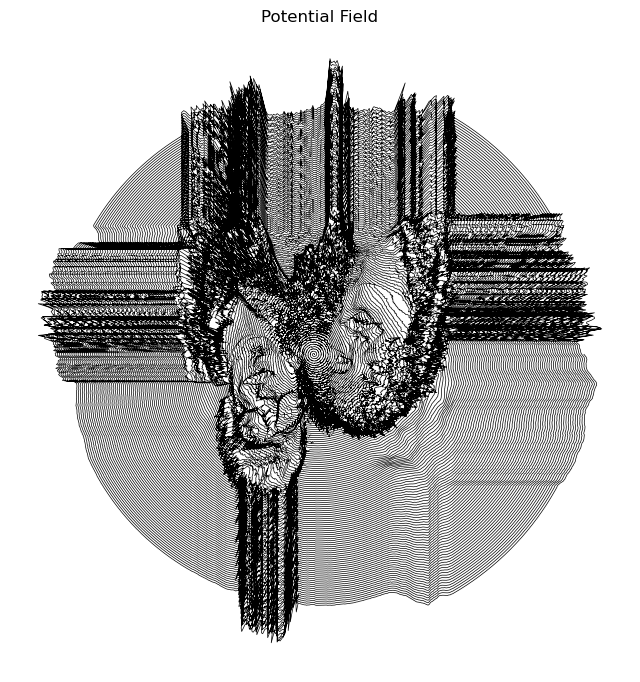

In [126]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
from PIL import Image

# Load and process the image
image_path = r"C:\Users\surabhit\Downloads\IMG-20240730-WA0037~2.jpg"# Update this path to your actual image path
#image_path = r"C:\Users\surabhit\Downloads\captain-haddock.png"  # Update this path to your actual image path
with Image.open(image_path) as img:
    img_gray = img.convert('L')  # Convert to grayscale
image_array = np.array(img_gray)

# Step 1: Display the grayscale image
plt.figure(figsize=(16, 12))
plt.imshow(img_gray, cmap='gray')
plt.title('Grayscale Image')
plt.axis('off')
plt.show()

# Step 2: Apply Gaussian filter to create a detailed potential field
sigma_value = 0.01  # Lower sigma for more detail
potential_field = gaussian_filter(image_array, sigma=sigma_value)

# Display the potential field
plt.figure(figsize=(16, 12))
plt.imshow(potential_field, cmap='gray')
plt.title('Smoothed Potential Field with sigma={}'.format(sigma_value))
plt.axis('off')
plt.show()

# Normalize the image for use as a potential field
normalized_image = potential_field / np.max(potential_field)

# Generate a closely packed base spiral
theta = np.linspace(0, 250 * np.pi, 160000)  # More turns and more points for smoother spiral
base_radius = 1 + theta  # Base radius proportional to theta

# Map coordinates from the spiral to the image, adjusting spiral's radius based on the image's intensity
x = base_radius * np.cos(theta)
y = base_radius * np.sin(theta)
x_indices = np.clip((x * image_array.shape[1] / np.max(base_radius) + image_array.shape[1] / 2).astype(int), 0, image_array.shape[1] - 1)
y_indices = np.clip((y * image_array.shape[0] / np.max(base_radius) + image_array.shape[0] / 2).astype(int), 0, image_array.shape[0] - 1)

# Modulate the spiral's radius based on the image's intensity
radius_multiplier = 1 + (1 - normalized_image[y_indices, x_indices]) * 0.3 # Increased impact by modifying contrast
radius_multiplier = np.maximum(radius_multiplier, 0.5)  # Ensuring a minimum radius multiplier

# Calculate the new radius
adjusted_radius = base_radius * radius_multiplier
adjusted_x = adjusted_radius * np.cos(theta)
adjusted_y = adjusted_radius * np.sin(theta)

# Plotting the final spiral
plt.figure(figsize=(8, 16))
plt.imshow(image_array, cmap='gray', extent=[-1, 1, -1, 1])
plt.plot(adjusted_x, adjusted_y, color='black', linewidth=0.5)
plt.title('Potential Field')
plt.axis('off')
plt.show()


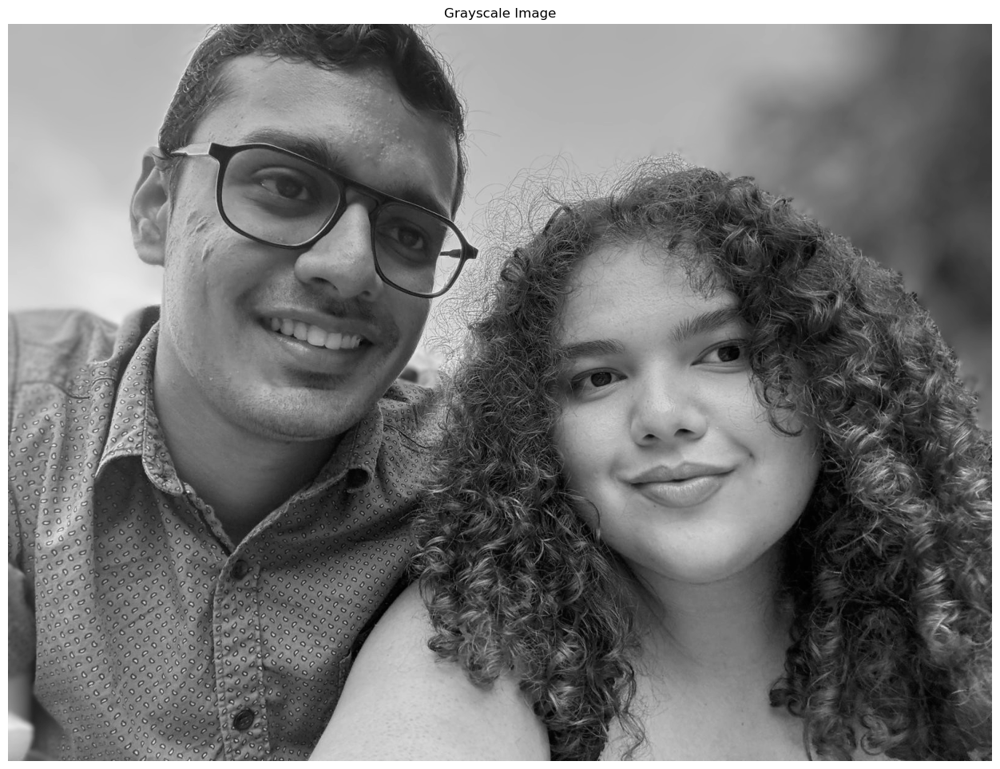

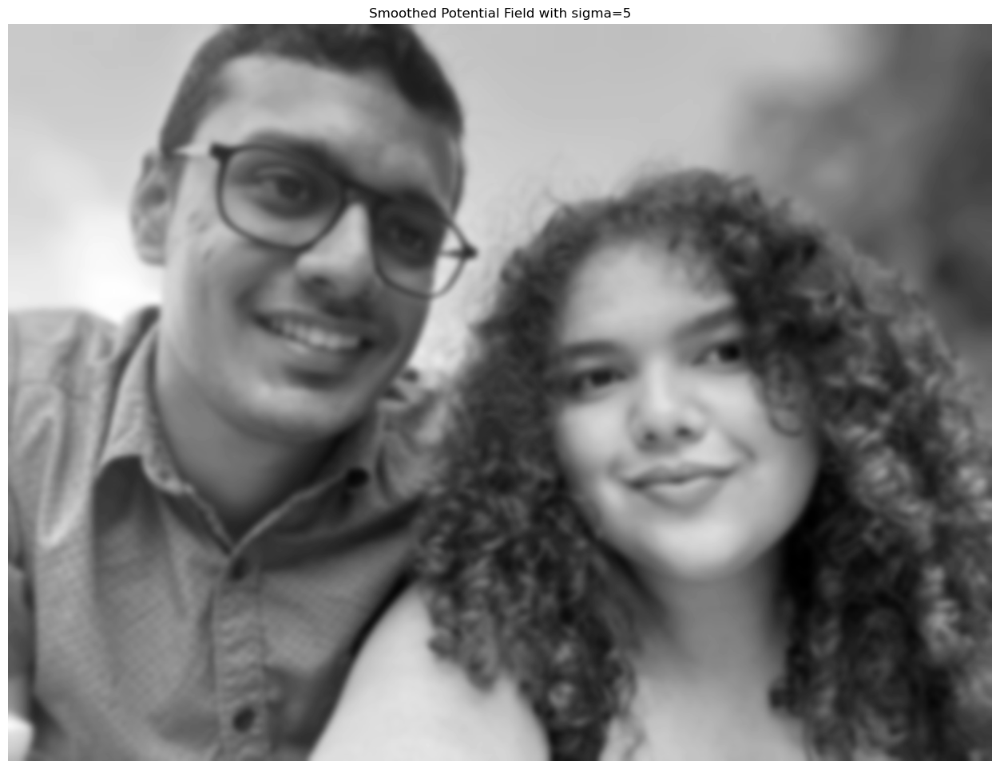

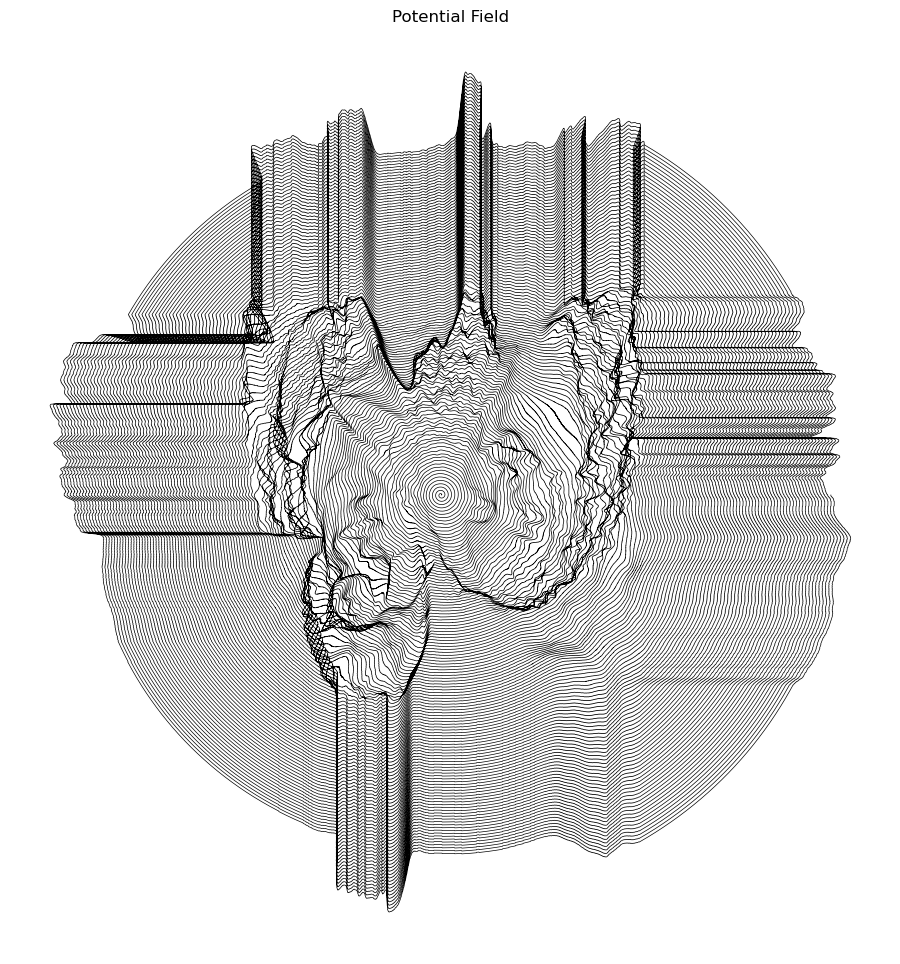

In [127]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
from PIL import Image

# Load and process the image
image_path = r"C:\Users\surabhit\Downloads\IMG-20240730-WA0037~2.jpg"  # Update this path to your actual image path
with Image.open(image_path) as img:
    img_gray = img.convert('L')  # Convert to grayscale
image_array = np.array(img_gray)

# Step 1: Display the grayscale image
plt.figure(figsize=(16, 12))
plt.imshow(img_gray, cmap='gray')
plt.title('Grayscale Image')
plt.axis('off')
plt.show()

# Step 2: Apply Gaussian filter to create a detailed potential field
sigma_value = 5  # Increased sigma for smoother transitions
potential_field = gaussian_filter(image_array, sigma=sigma_value)

# Display the potential field
plt.figure(figsize=(16, 12))
plt.imshow(potential_field, cmap='gray')
plt.title('Smoothed Potential Field with sigma={}'.format(sigma_value))
plt.axis('off')
plt.show()

# Normalize the image for use as a potential field
normalized_image = potential_field / np.max(potential_field)

# Generate a closely packed base spiral
theta = np.linspace(0, 250 * np.pi, 1600000)  # More turns and more points for smoother spiral
base_radius = 1 + theta  # Base radius proportional to theta

# Map coordinates from the spiral to the image, adjusting spiral's radius based on the image's intensity
x = base_radius * np.cos(theta)
y = base_radius * np.sin(theta)
x_indices = np.clip((x * image_array.shape[1] / np.max(base_radius) + image_array.shape[1] / 2).astype(int), 0, image_array.shape[1] - 1)
y_indices = np.clip((y * image_array.shape[0] / np.max(base_radius) + image_array.shape[0] / 2).astype(int), 0, image_array.shape[0] - 1)

# Modulate the spiral's radius based on the image's intensity
radius_multiplier = 1 + (1 - normalized_image[y_indices, x_indices]) * 0.3  # Reduce the impact by modifying contrast
radius_multiplier = np.maximum(radius_multiplier, 0.5)  # Ensuring a minimum radius multiplier

# Calculate the new radius
adjusted_radius = base_radius * radius_multiplier
adjusted_x = adjusted_radius * np.cos(theta)
adjusted_y = adjusted_radius * np.sin(theta)

# Plotting the final spiral
plt.figure(figsize=(16, 12))
plt.imshow(image_array, cmap='gray', extent=[-1, 1, -1, 1])
plt.plot(adjusted_x, adjusted_y, color='black', linewidth=0.5)
plt.title('Potential Field')
plt.axis('off')
plt.show()


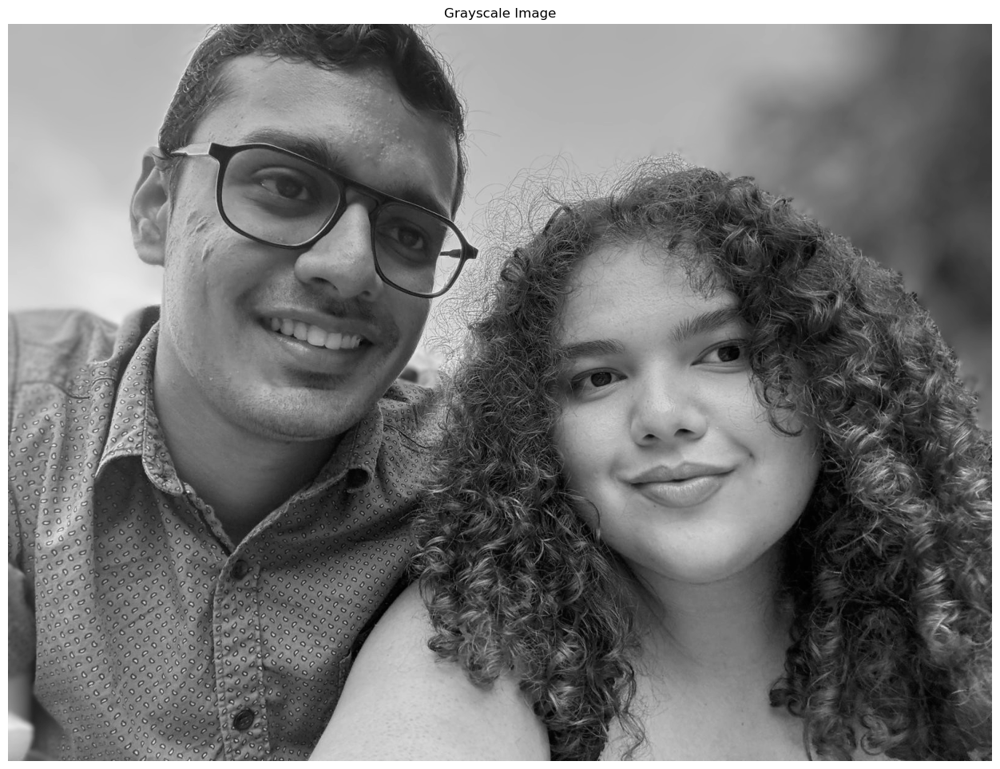

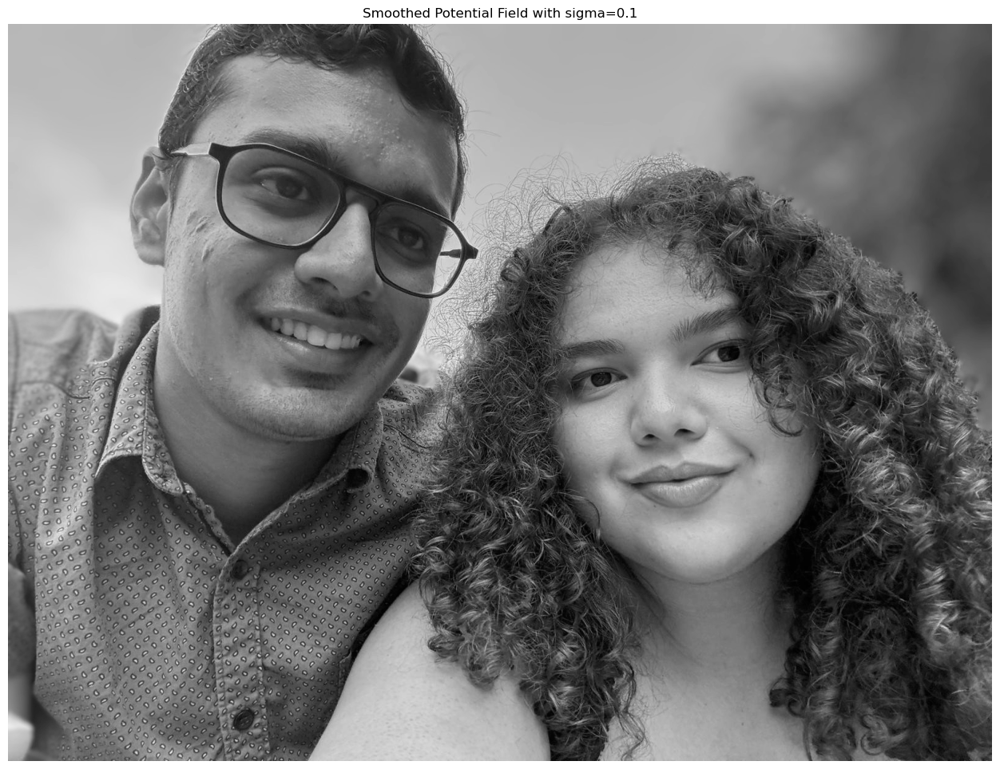

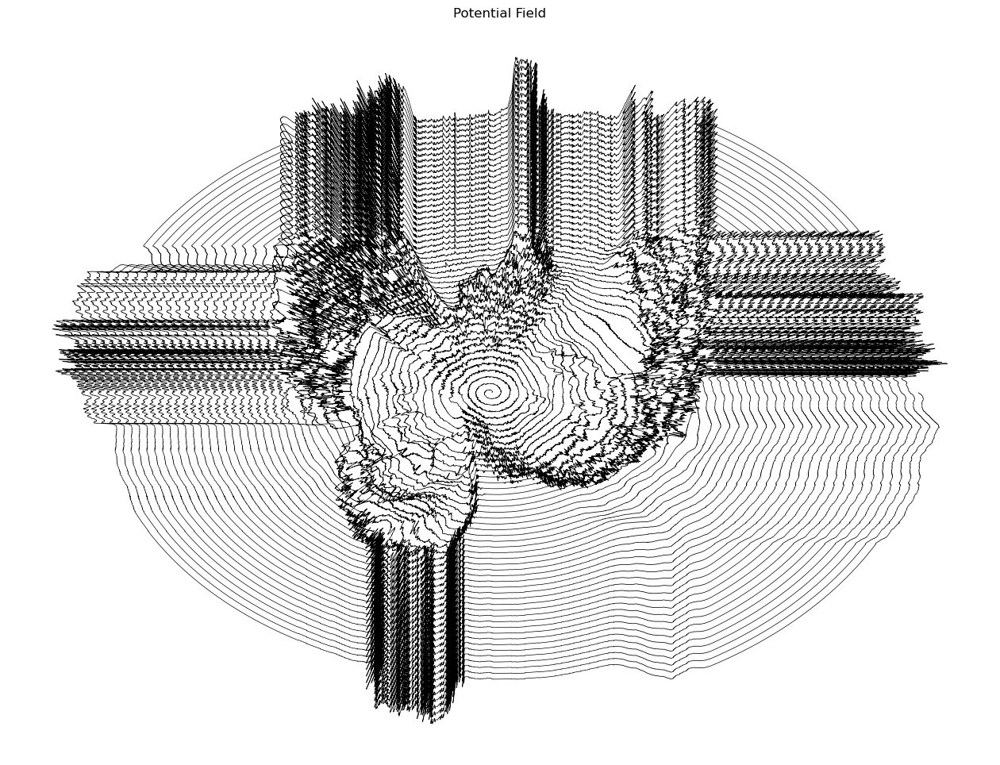

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
from PIL import Image

# Load and process the image
image_path = r"C:\Users\surabhit\Downloads\IMG-20240730-WA0037~2.jpg"  # Update this path to your actual image path
with Image.open(image_path) as img:
    img_gray = img.convert('L')  # Convert to grayscale
image_array = np.array(img_gray)

# Step 1: Display the grayscale image
plt.figure(figsize=(16, 12))
plt.imshow(img_gray, cmap='gray')
plt.title('Grayscale Image')
plt.axis('off')
plt.show()

# Step 2: Apply Gaussian filter to create a detailed potential field
sigma_value = 0.1#5  # Increased sigma for smoother transitions
potential_field = gaussian_filter(image_array, sigma=sigma_value)

# Display the potential field
plt.figure(figsize=(16, 12))
plt.imshow(potential_field, cmap='gray')
plt.title('Smoothed Potential Field with sigma={}'.format(sigma_value))
plt.axis('off')
plt.show()

# Normalize the image for use as a potential field
normalized_image = potential_field / np.max(potential_field)

# Generate a closely packed base spiral
theta = np.linspace(0, 100 * np.pi, 16000000)  # More turns and more points for smoother spiral
base_radius = 1 + theta  # Base radius proportional to theta

# Map coordinates from the spiral to the image, adjusting spiral's radius based on the image's intensity
x = base_radius * np.cos(theta)
y = base_radius * np.sin(theta)
x_indices = np.clip((x * image_array.shape[1] / np.max(base_radius) + image_array.shape[1] / 2).astype(int), 0, image_array.shape[1] - 1)
y_indices = np.clip((y * image_array.shape[0] / np.max(base_radius) + image_array.shape[0] / 2).astype(int), 0, image_array.shape[0] - 1)

# Modulate the spiral's radius based on the image's intensity
radius_multiplier = 1 + (1 - normalized_image[y_indices, x_indices]) * 0.3  # Reduce the impact by modifying contrast
radius_multiplier = np.maximum(radius_multiplier, 1)  # Ensuring a minimum radius multiplier

# Calculate the new radius
adjusted_radius = base_radius * radius_multiplier
adjusted_x = adjusted_radius * np.cos(theta)
adjusted_y = adjusted_radius * np.sin(theta)

# Mask out the spiral parts that fall outside the image bounds
mask = (
    (adjusted_x >= -image_array.shape[1] / 2) & 
    (adjusted_x <= image_array.shape[1] / 2) & 
    (adjusted_y >= -image_array.shape[0] / 2) & 
    (adjusted_y <= image_array.shape[0] / 2)
)
adjusted_x = adjusted_x[mask]
adjusted_y = adjusted_y[mask]

# Plotting the final spiral
plt.figure(figsize=(16, 12))
#plt.imshow(image_array, cmap='gray', extent=[-image_array.shape[1]/2, image_array.shape[1]/2, -image_array.shape[0]/2, image_array.shape[0]/2])
plt.plot(adjusted_x, adjusted_y, color='black', linewidth=0.5)
plt.title('Potential Field')
plt.axis('off')
plt.show()


In [48]:
def generate_gcode(x_coords, y_coords, filename):
    # Header for the G-code, initializing settings
    header = [
        '%',
        'G21 ; Set units to millimeters',
        'G90 ; Use absolute coordinates',
        'G01 F1500 ; Set the feed rate',
        'G28 ; Home all axes',
        'G92 X0 Y0 Z0 ; Set current position to origin',
        'M3 S1000 ; Turn on the spindle at 1000 RPM',
        'G4 P1 ; Dwell for 1 second',
        'G01 Z-1 ; Lower the tool'
    ]
    
    # Footer to turn off the spindle and end the program
    footer = [
        'G01 Z10 ; Raise the tool',
        'M5 ; Turn off the spindle',
        'G28 ; Home all axes',
        'M30 ; End of program',
        '%'
    ]
    
    # Body of the G-code, consisting of move commands based on x and y coordinates
    body = []
    for x, y in zip(x_coords, y_coords):
        command = f"G01 X{x:.3f} Y{y:.3f}"
        body.append(command)
    
    # Combine all parts of the G-code
    full_gcode = '\n'.join(header + body + footer)
    
    # Write G-code to a file
    with open(filename, 'w') as file:
        file.write(full_gcode)
    
    print(f"G-code successfully written to {filename}")

# Adjust these to match the coordinate scaling for your CNC machine or 3D printer
scale_factor = 10  # Adjust this based on your machine's working area and required scaling
adjusted_x_scaled = adjusted_x * scale_factor
adjusted_y_scaled = adjusted_y * scale_factor

# Generate G-code file
generate_gcode(adjusted_x_scaled, adjusted_y_scaled, 'spiral_gcode.txt')


G-code successfully written to spiral_gcode.txt


In [49]:
import ezdxf

def generate_dxf(x_coords, y_coords, filename):
    # Create a new DXF document
    doc = ezdxf.new('R2010')  # Use the DXF R2010 standard; you can adjust this as needed
    msp = doc.modelspace()  # Add a modelspace to the document

    # Create a polyline from the spiral coordinates
    polyline = msp.add_lwpolyline([(x, y) for x, y in zip(x_coords, y_coords)],
                                  close=False,  # Change to True if you want a closed loop
                                  dxfattribs={'layer': 'SpiralLayer'})

    # Set some attributes like color, if necessary
    polyline.dxf.color = 7  # Color code (white)

    # Save the DXF file
    doc.saveas(filename)
    print(f"DXF file successfully written to {filename}")

# Assuming `adjusted_x` and `adjusted_y` are your spiral coordinates
generate_dxf(adjusted_x, adjusted_y, 'spiral.dxf')


DXF file successfully written to spiral.dxf


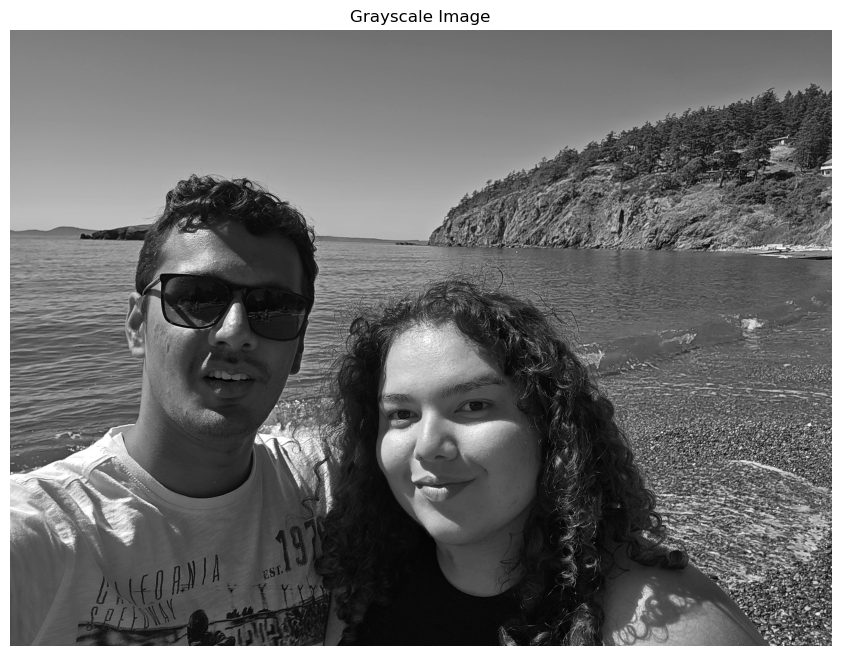

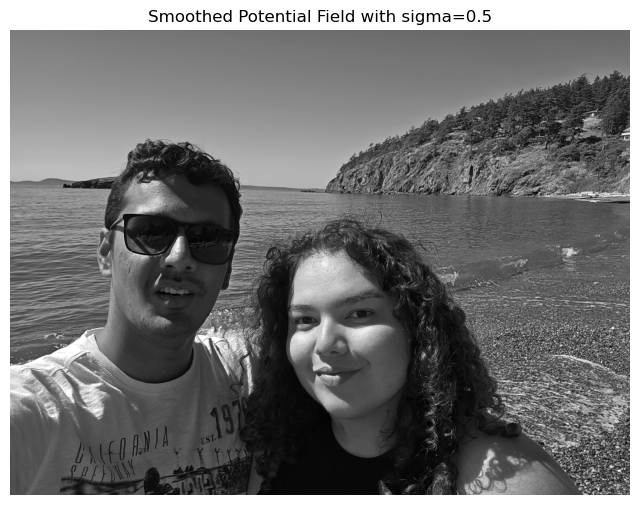

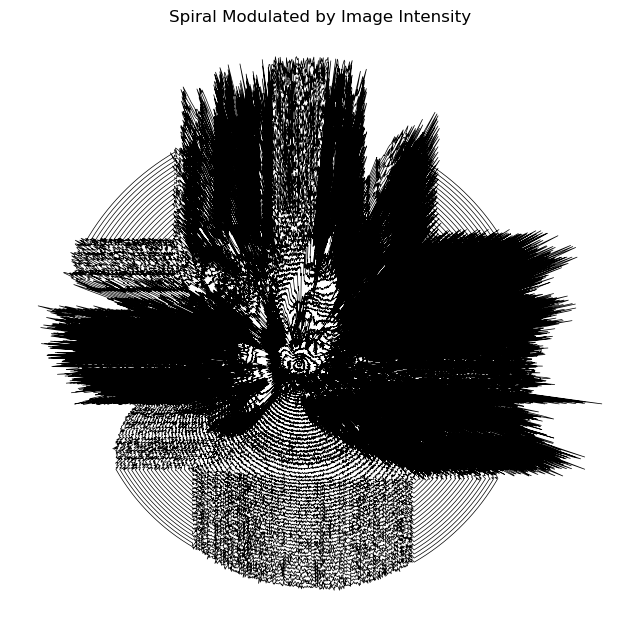

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
from PIL import Image

# Load and process the image
image_path = r"C:\Users\surabhit\Downloads\20240803_150651(0).jpg"
# Update this path to your actual image path
#image_path = r"C:\Users\surabhit\Downloads\captain-haddock.png"  # Update this path to your actual image path
with Image.open(image_path) as img:
    img_gray = img.convert('L')  # Convert to grayscale
image_array = np.array(img_gray)

# Step 1: Display the grayscale image
plt.figure(figsize=(16, 8))
plt.imshow(img_gray, cmap='gray')
plt.title('Grayscale Image')
plt.axis('off')
plt.show()

# Step 2: Apply Gaussian filter to create a detailed potential field
sigma_value = 0.5  # Lower sigma for more detail
potential_field = gaussian_filter(image_array, sigma=sigma_value)

# Display the potential field
plt.figure(figsize=(8, 8))
plt.imshow(potential_field, cmap='gray')
plt.title('Smoothed Potential Field with sigma={}'.format(sigma_value))
plt.axis('off')
plt.show()

# Normalize the image for use as a potential field
normalized_image = potential_field / np.max(potential_field)

# Generate a closely packed base spiral
theta = np.linspace(0, 130 * np.pi, 160000)  # More turns and more points for smoother spiral
base_radius = 1 + theta  # Base radius proportional to theta

# Map coordinates from the spiral to the image, adjusting spiral's radius based on the image's intensity
x = base_radius * np.cos(theta)
y = base_radius * np.sin(theta)
x_indices = np.clip((x * image_array.shape[1] / np.max(base_radius) + image_array.shape[1] / 2).astype(int), 0, image_array.shape[1] - 1)
y_indices = np.clip((y * image_array.shape[0] / np.max(base_radius) + image_array.shape[0] / 2).astype(int), 0, image_array.shape[0] - 1)

# Modulate the spiral's radius based on the image's intensity
radius_multiplier = 1 + (1 - normalized_image[y_indices, x_indices]) * 2  # Increased impact by modifying contrast
radius_multiplier = np.maximum(radius_multiplier, 0.7)  # Ensuring a minimum radius multiplier

# Calculate the new radius
adjusted_radius = base_radius * radius_multiplier
adjusted_x = adjusted_radius * np.cos(theta)
adjusted_y = adjusted_radius * np.sin(theta)

# Plotting the final spiral
plt.figure(figsize=(8, 16))
plt.imshow(image_array, cmap='gray', extent=[-1, 1, -1, 1])
plt.plot(adjusted_x, adjusted_y, color='black', linewidth=0.5)
plt.title('Spiral Modulated by Image Intensity')
plt.axis('off')
plt.show()
